**NB**: Karena pada website github tidak support untuk membuka plot interaktif maka saya menggunakan alternatif lain yaitu dengan menggunakan NBViewer pada link berikut.

https://nbviewer.org/github/yusrainiasraa/H8_PYTN-KS19-017_5/blob/main/PYTN_Assgn_1_5_Yusraini.ipynb

# Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium
import warnings
warnings.filterwarnings('ignore')

# Preprocessing Data

Mendefinisikan data lalu import file csv dengan pd.read_csv. Setelah itu membuat salinan dari data asli dengan mendefinisikan sebagai df agar data asli tidak rusak.

In [2]:
data = pd.read_csv('london_crime_by_lsoa.csv')
df = data.copy()
df.head()

,lsoa_code,borough,major_category,minor_category,value,year,month
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6


Mengecek apakah terdapat null value pada dataset

In [3]:
df.isnull().sum()

lsoa_code         0
borough           0
major_category    0
minor_category    0
value             0
year              0
month             0
dtype: int64

Kolom year dan month akan digabungkan ke dalam kolom baru yakni date, lalu diubah menjadi datetime.

In [4]:
date = []
for i,j in zip(df['year'],df['month']):
    date.append(f'{i} {j}')
df['date'] = date

df['date'] = pd.to_datetime(df['date'])

df.head()

,lsoa_code,borough,major_category,minor_category,value,year,month,date
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11,2016-11-01
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11,2016-11-01
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5,2015-05-01
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3,2016-03-01
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6,2008-06-01


Melakukan drop pada kolom yang tidak diperlukan. Lalu menjadikan kolom date sebagai index dan mengurutkan dataset berdasarkan date.

In [5]:
df.drop(['lsoa_code','year','month'],axis=1,inplace=True)
df = df.set_index('date').sort_values('date')
df.head()

,borough,major_category,minor_category,value
date,,,,
2008-01-01,Barking and Dagenham,Burglary,Burglary in Other Buildings,3
2008-01-01,Redbridge,Criminal Damage,Criminal Damage To Dwelling,0
2008-01-01,Barnet,Drugs,Drug Trafficking,0
2008-01-01,Hammersmith and Fulham,Violence Against the Person,Common Assault,0
2008-01-01,Barking and Dagenham,Sexual Offences,Other Sexual,0


# Line Plot
### What Year Had The Most Crimes?

Membuat dataframe baru yakni crimes_year yang berisi jumlah kejahatan per tahun.

In [6]:
crimes_year = df.groupby(df.index.year)[['value']].sum()
crimes_year.head()

,value
date,
2008,738641
2009,717214
2010,715324
2011,724915
2012,737329


Membuat line plot untuk memvisualisasikan jumlah kejahatan per tahun dengan menggunakan matplotlib.

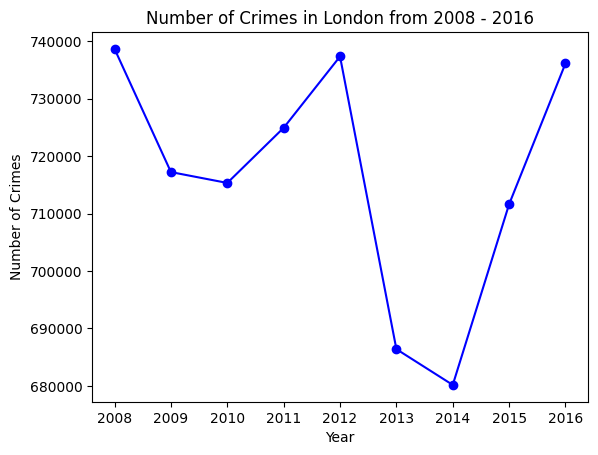

In [7]:
crimes_year.plot(kind='line', marker='o', color='blue', legend=False)

plt.title('Number of Crimes in London from 2008 - 2016')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')

plt.show()

Karena matplotlib tidak cukup interaktif dalam memvisualisasikan data, maka untuk selanjutnya visualisasi akan dilakukan dengan plotly.

In [8]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = crimes_year.index,
                         y = crimes_year['value'],
                         mode = 'lines+markers',
                         line = dict(color = 'blue')))
fig.update_layout(title = 'Number of Crimes in London from 2008 - 2016',
                  title_x = 0.5,
                  xaxis_title = 'Year',
                  yaxis_title = 'Number of Crimes')
fig.show()

**Kesimpulan:** Berdasarkan grafik di atas dapat disimpulkan bahwa jumlah kejahatan tertinggi terjadi pada tahun 2008, yaitu sebesar 738.641 dan jumlah kejahatan terendah terjadi pada tahun 2014, yaitu sebesar 680.183. 

# Bar Chart
### Major Category Crimes in Each Borough

Membuat dataframe baru yang berisikan value, serta major category dan borough.

In [9]:
bor_maj = df.groupby(['borough','major_category'])[['value']].sum().reset_index()
bor_maj.head()

,borough,major_category,value
0,Barking and Dagenham,Burglary,18103
1,Barking and Dagenham,Criminal Damage,18888
2,Barking and Dagenham,Drugs,9188
3,Barking and Dagenham,Fraud or Forgery,205
4,Barking and Dagenham,Other Notifiable Offences,2819


Membuat bar chart untuk memvisualisasikan setiap major category crime di seluruh borough menggunakan plotly

In [10]:
fig = px.bar(bor_maj,
             x = 'borough',
             y = 'value',
             color = 'major_category',
             labels = {'borough':'Boroughs','value':'Number of Crimes'},
             category_orders = {'borough':df.groupby('borough')[['value']].sum().sort_values('value', ascending=False).index})
fig.update_layout(title = 'Each Major Category Crimes by Borough',
                  title_x = 0.5,
                  legend = dict(title = 'Major Categories'))
fig.show()

Kesimpulan: Berdasarkan bar plot di atas, dapat dilihat bahwa Westminster memiliki jumlah kejahatan tertinggi sebanyak lebih dari 400k crimes, dengan theft and handling menjadi kejahatan yang paling sering terjadi dibandingkan kejahatan lainnya. 

# Pie Chart
### What Crimes Have the Highest Percentage on Each Crime Categories?

Membuat total value untuk persentase nantinya

In [12]:
total = df['value'].sum()

Membuat dataframe major yang berisi value berdasarkan major category, lalu menghitung persentasenya dengan dibagi total dikali 100, diambil 3 digit desimal.

In [13]:
major = df.groupby('major_category')[['value']].sum()
major['percentage'] = (major['value'] / total * 100).round(decimals=3)
major = major.sort_values('percentage', ascending=False).reset_index()
major.head()

,major_category,value,percentage
0,Theft and Handling,2661861,41.284
1,Violence Against the Person,1558081,24.165
2,Burglary,754293,11.699
3,Criminal Damage,630938,9.785
4,Drugs,470765,7.301


Membuat dataframe minor yang berisi value berdasarkan minor category, lalu menghitung persentasenya dengan dibagi total dikali 100, diambil 3 digit desimal.

In [14]:
minor = df.groupby('minor_category')[['value']].sum()
minor['percentage'] = (minor['value'] / total * 100).round(decimals=3)
minor = minor.sort_values('percentage', ascending=False).reset_index()
minor.head()

,minor_category,value,percentage
0,Other Theft,980085,15.200
1,Theft From Motor Vehicle,569956,8.840
2,Burglary in a Dwelling,491282,7.619
3,Harassment,458124,7.105
4,Assault with Injury,451001,6.995


Memvisualisasikan pie chart masing-masing crime category dengan subplot plotly

In [15]:
from plotly.subplots import make_subplots

fig = make_subplots(rows = 1, cols = 2, specs = [[{'type':'pie'}, {'type':'pie'}]],
                    subplot_titles = ('Major Categories','Minor Categories'))

fig.add_trace(go.Pie(labels = major['major_category'],
                     values = major['value'],
                     name = 'Major Category',
                     pull = [0.1],
                     showlegend = False), 1, 1)
fig.add_trace(go.Pie(labels = minor['minor_category'],
                     values = minor['value'],
                     name = 'Minor Category',
                     pull = [0.1],
                     showlegend = False), 1, 2)

fig.update_traces(hoverinfo='label+percent+name')
fig.update_layout(title='Percentage of Crimes', title_x=0.5)
fig.show()

Kesimpulan: 

# Area Plot
### Top 5 Borough With The Most Crimes

Menjumlahkan value berdasarkan borough lalu mengurutkannya dari yang tertinggi dan mengambil 5 besar saja dengan head()

In [16]:
top5_borough = df.groupby('borough')[['value']].sum().sort_values('value',ascending=False).head().index
top5_borough

Index(['Westminster', 'Lambeth', 'Southwark', 'Camden', 'Newham'], dtype='object', name='borough')

Slicing dataset top5_borough yang hanya berisi 5 daerah dengan jumlah kejahatan tertinggi

In [17]:
top5 = df[df['borough'].isin(top5_borough)][['borough','value']]
top5 = top5.groupby(['borough',top5.index.year])[['value']].sum().reset_index()
top5.head()

,borough,date,value
0,Camden,2008,32010
1,Camden,2009,31612
2,Camden,2010,31804
3,Camden,2011,33956
4,Camden,2012,31472


Membuat area plot untuk memvisualisasikan top 5 borough dengan kejahatan tertinggi

In [18]:
fig = px.area(top5, 
              x='date', 
              y='value', 
              color='borough',
              labels = {'borough':'Boroughs','date':'Years','value':'Number of Crimes'})
fig.update_layout(title='Top 5 Boroughs with the Most Crimes', title_x=0.5)
fig.show()

Kesimpulan: 

# Histogram and Box Plot
### Statistical Monthly Report on Westminster (Borough with The Most Crimes)

Mengambil value dari borough yang memiliki kejahatan tertinggi yakni Westminster per bulan

In [19]:
Westminster = df[df['borough']=='Westminster'][['value']].resample('M').sum()
Westminster.head()

,value
date,
2008-01-31,3957
2008-02-29,3880
2008-03-31,3896
2008-04-30,3725
2008-05-31,3849


Memvisualisasikannya dengan box plot dan histogram agar lebih mudah untuk dianalisis secara statistik

In [20]:
fig = px.histogram(Westminster,
                   x='value',
                   barmode='stack',
                   marginal='box')
fig.update_layout(title='Number of Crimes in Westminster by Month',
                  title_x=0.5,
                  xaxis_title='Crimes',
                  yaxis_title='Count')
fig.show()

Kesimpulan: 

# Scatter Plot
### Do Time Affects Number of Crimes and How Strong Is It?

Membuat dataframe baru yang berisi value crimes berdasarkan date (perbulan)

In [21]:
value_per_month = df.groupby('date')[['value']].sum().reset_index()
value_per_month.head()

,date,value
0,2008-01-01,65419
1,2008-02-01,62626
2,2008-03-01,61343
3,2008-04-01,59640
4,2008-05-01,62587


Membuat scatterplot dan menambahkan trendline ols agar dapat melihat R^2 untuk regresi

In [22]:
fig = px.scatter(value_per_month, x='date', y='value',trendline='ols')
fig.update_layout(title='Linear Regression of Crimes and Time',
                  title_x=0.5,
                  xaxis_title='Time',
                  yaxis_title='Crimes')
fig.show()

Kesimpulan: 

# Word Cloud
### What are the Most Frequently Occurring Words in Minor Categories?

Membuat wordcloud untuk menemukan kata yang paling sering muncul di minor category

In [23]:
from wordcloud import WordCloud,STOPWORDS

stopwords = set(STOPWORDS)

plt.figure(figsize=(4,4),dpi=200)
crimes_wordcloud = WordCloud(background_color='white',
                             stopwords=stopwords).generate(' '.join(df['minor_category']))
plt.imshow(crimes_wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

Kesimpulan: 

# Folium and Choropleth Maps
### How were Crimes in London in General?

Mengurutkan dataset berdasarkan kolom daerah dan didefinisikan sebagai borough_order

In [ ]:
borough_order = df.sort_values('borough')
borough_order.head()

,borough,major_category,minor_category,value
date,,,,
2008-01-01,Barking and Dagenham,Burglary,Burglary in Other Buildings,3
2009-08-01,Barking and Dagenham,Criminal Damage,Criminal Damage To Dwelling,1
2012-02-01,Barking and Dagenham,Theft and Handling,Motor Vehicle Interference & Tampering,0
2013-11-01,Barking and Dagenham,Theft and Handling,Theft From Shops,0
2013-11-01,Barking and Dagenham,Criminal Damage,Criminal Damage To Dwelling,2


Mencari titik koordinat, yaitu latitude dan longitude di setiap daerah

In [ ]:
from geopy.geocoders import Nominatim

geolocator = Nominatim(user_agent='MyApp')

latitude,longitude = ([] for i in range(2))
for i in borough_order['borough'].unique():
    location = geolocator.geocode(i,timeout=None)
    latitude.append(location.latitude)
    longitude.append(location.longitude)

Split dataset borough_order berdasarkan borough untuk memudahkan

In [ ]:
temp_borough = []
for i in borough_order['borough'].unique():
    temp_borough.append(borough_order[borough_order['borough'] == i])

Memasukkan titik koordinat ke borough yang telah di-split

In [ ]:
for i,j,k in zip(temp_borough,latitude,longitude):
    i.insert(4,'latitude',j)
    i.insert(5,'longitude',k)

Menggabungkan dataset yang telah di-split dan mengurutkan berdasarkan date index

In [ ]:
borough_coordinate = pd.concat(temp_borough)
borough_coordinate = borough_coordinate.sort_index()
borough_coordinate.head()

,borough,major_category,minor_category,value,latitude,longitude
date,,,,,,
2008-01-01,Barking and Dagenham,Burglary,Burglary in Other Buildings,3,51.554091,0.150489
2008-01-01,Richmond upon Thames,Theft and Handling,Handling Stolen Goods,0,51.440553,-0.307639
2008-01-01,Brent,Drugs,Possession Of Drugs,0,32.937346,-87.164718
2008-01-01,Richmond upon Thames,Robbery,Personal Property,0,51.440553,-0.307639
2008-01-01,Brent,Violence Against the Person,Harassment,0,32.937346,-87.164718


Untuk mengurangi computational cost, akan diambil 5000 sample dari dataset

In [ ]:
borough_coordinate_sample = borough_coordinate.sample(n=5000,random_state=42,axis=0)
borough_coordinate_sample.head()

,borough,major_category,minor_category,value,latitude,longitude
date,,,,,,
2016-01-01,Tower Hamlets,Burglary,Burglary in a Dwelling,0,51.128863,1.298669
2008-09-01,Croydon,Criminal Damage,Other Criminal Damage,1,51.371305,-0.101957
2008-05-01,Camden,Theft and Handling,Theft From Motor Vehicle,1,39.944840,-75.119891
2010-02-01,Newham,Violence Against the Person,Harassment,0,51.530016,0.029309
2013-12-01,Greenwich,Other Notifiable Offences,Going Equipped,0,51.468626,0.048831


Mencari titik koordinat di London

In [ ]:
london = geolocator.geocode('London',timeout=None)

print(f"London's latitude\t:{london.latitude}")
print(f"London's longitude\t:{london.longitude}")

London's latitude	:51.5073359
London's longitude	:-0.12765


Membuat folium map untuk menampilkan kejahatan yang terjadi di London secara umum

In [ ]:
from folium import plugins

london_map = folium.Map(location=[london.latitude,london.longitude],zoom_start=10)

crimes = plugins.MarkerCluster().add_to(london_map)

for i,j,k in zip(borough_coordinate_sample['latitude'],
                 borough_coordinate_sample['longitude'],
                 borough_coordinate_sample['major_category']):
    folium.Marker(location=[i,j],
                  icon=None,
                  popup=k).add_to(crimes)

london_map

Kesimpulan: 

Download GeoJSON file yang mendefinisikan daerah di London

In [ ]:
from urllib.request import urlopen
import json
with urlopen('https://skgrange.github.io/www/data/london_boroughs.json') as response:
    london_boroughs = json.load(response)

Mengambil ID untuk tiap daerah dari GeoJSON file

In [ ]:
boroughs_id = {}
for i in london_boroughs['features']:
    i['id'] = i['properties']['id']
    boroughs_id[i['properties']['name']] = i['id']

Menambahkan ID ke dataframe

In [ ]:
borough_crimes = df.groupby('borough')[['value']].sum().reset_index()
borough_crimes['id'] = borough_crimes['borough'].apply(lambda x: boroughs_id[x])
borough_crimes.head()

,borough,value,id
0,Barking and Dagenham,149447,32
1,Barnet,212191,10
2,Bexley,114136,15
3,Brent,227551,9
4,Bromley,184349,3


Membuat Chloropleth Maps untuk memvisualisasikan jumlah kejahatan di London pada tahun 2008-2016

In [ ]:
fig = go.Figure()
fig = px.choropleth_mapbox(borough_crimes,
                           geojson=london_boroughs,
                           locations='id',
                           color='value',
                           color_continuous_scale='pubu',
                           mapbox_style='carto-positron',
                           labels={'id':'ID','value':'Number of Crimes'},
                           hover_name='borough',
                           center={'lat':london.latitude - 0.02,'lon':london.longitude},
                           zoom=8.7)
fig.update_layout(margin={'r':0,'l':0,'b':0},title='Number of Crimes in London from 2008 - 2016',title_x=0.5)
fig.show()

Kesimpulan: 